In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

# Create a directory for the dataset
os.makedirs('/content/siim-isic-melanoma', exist_ok=True)


# Download metadata
!wget -O /content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv https://isic-challenge-data.s3.amazonaws.com/2020/ISIC_2020_Training_GroundTruth_v2.csv


--2024-07-28 15:53:48--  https://isic-challenge-data.s3.amazonaws.com/2020/ISIC_2020_Training_GroundTruth_v2.csv
Resolving isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)... 16.182.69.57, 3.5.20.129, 3.5.29.159, ...
Connecting to isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)|16.182.69.57|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2387418 (2.3M) [text/csv]
Saving to: ‘/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv’

/content/siim-isic- 100%[===================>]   2.28M  4.43MB/s    in 0.5s    

2024-07-28 15:53:49 (4.43 MB/s) - ‘/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv’ saved [2387418/2387418]



In [ ]:
# Load metadata
metadata = pd.read_csv('/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv')

# Display the first few rows of the metadata
print(metadata.head())

     image_name  patient_id   lesion_id     sex  age_approx  \
0  ISIC_2637011  IP_7279968  IL_7972535    male        45.0   
1  ISIC_0015719  IP_3075186  IL_4649854  female        45.0   
2  ISIC_0052212  IP_2842074  IL_9087444  female        50.0   
3  ISIC_0068279  IP_6890425  IL_4255399  female        45.0   
4  ISIC_0074268  IP_8723313  IL_6898037  female        55.0   

  anatom_site_general_challenge diagnosis benign_malignant  target  
0                     head/neck   unknown           benign       0  
1               upper extremity   unknown           benign       0  
2               lower extremity     nevus           benign       0  
3                     head/neck   unknown           benign       0  
4               upper extremity   unknown           benign       0  


In [ ]:
metadata.isnull().sum()

image_name                         0
patient_id                         0
lesion_id                          0
sex                               65
age_approx                        68
anatom_site_general_challenge    527
diagnosis                          0
benign_malignant                   0
target                             0
dtype: int64

In [ ]:
import pandas as pd

metadata_path = '/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv'

# Load metadata
metadata = pd.read_csv(metadata_path)

# Remove rows with missing values
metadata_cleaned = metadata.dropna()

# Check the cleaned data
metadata_cleaned.isnull().sum()


image_name                       0
patient_id                       0
lesion_id                        0
sex                              0
age_approx                       0
anatom_site_general_challenge    0
diagnosis                        0
benign_malignant                 0
target                           0
dtype: int64

In [ ]:


# Summary Statistics
print(metadata_cleaned.describe(include='all'))


          image_name  patient_id   lesion_id    sex    age_approx  \
count          32531       32531       32531  32531  32531.000000   
unique         32531        2051       32130      2           NaN   
top     ISIC_2637011  IP_7279968  IL_1974508   male           NaN   
freq               1         115           2  16788           NaN   
mean             NaN         NaN         NaN    NaN     48.917801   
std              NaN         NaN         NaN    NaN     14.409022   
min              NaN         NaN         NaN    NaN      0.000000   
25%              NaN         NaN         NaN    NaN     40.000000   
50%              NaN         NaN         NaN    NaN     50.000000   
75%              NaN         NaN         NaN    NaN     60.000000   
max              NaN         NaN         NaN    NaN     90.000000   

       anatom_site_general_challenge diagnosis benign_malignant        target  
count                          32531     32531            32531  32531.000000  
unique     

In [ ]:
# Number of rows and columns
rows, cols = metadata_cleaned.shape
print(f"Number of rows: {rows}")
print(f"Number of columns: {cols}")


Number of rows: 32531
Number of columns: 9


In [ ]:
# Unique values in each feature
unique_values = metadata_cleaned.nunique()
print("Unique values in each feature:")
print(unique_values)


Unique values in each feature:
image_name                       32531
patient_id                        2051
lesion_id                        32130
sex                                  2
age_approx                          18
anatom_site_general_challenge        6
diagnosis                            9
benign_malignant                     2
target                               2
dtype: int64


In [ ]:
# Count of unique values in the 'sex' column
sex_counts = metadata_cleaned['sex'].value_counts()
print("Sex counts:")
print(sex_counts)

# Count of unique values in the 'anatom_site_general_challenge' column
anatom_site_counts = metadata_cleaned['anatom_site_general_challenge'].value_counts()
print("Anatomical Site counts:")
print(anatom_site_counts)

# Count of unique values in the 'benign_malignant' column
benign_malignant_counts = metadata_cleaned['benign_malignant'].value_counts()
print("Benign/Malignant counts:")
print(benign_malignant_counts)


Sex counts:
sex
male      16788
female    15743
Name: count, dtype: int64
Anatomical Site counts:
anatom_site_general_challenge
torso              16825
lower extremity     8399
upper extremity     4963
head/neck           1845
palms/soles          375
oral/genital         124
Name: count, dtype: int64
Benign/Malignant counts:
benign_malignant
benign       31956
malignant      575
Name: count, dtype: int64


benign_malignant
benign       31956
malignant      575
Name: count, dtype: int64


<ipython-input-75-2de4e346b300>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='benign_malignant', data=metadata_cleaned, palette='Set2')


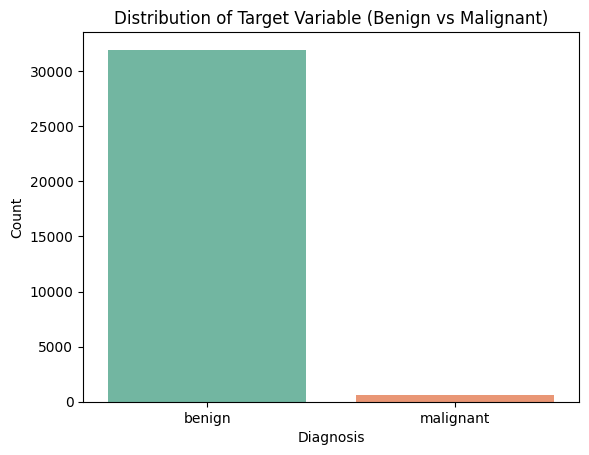

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution of the Target Variable (benign_malignant)
target_distribution = metadata_cleaned['benign_malignant'].value_counts()
print(target_distribution)

# Plotting the Target Variable Distribution
sns.countplot(x='benign_malignant', data=metadata_cleaned, palette='Set2')
plt.title('Distribution of Target Variable (Benign vs Malignant)')
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.show()


count    32531.000000
mean        48.917801
std         14.409022
min          0.000000
25%         40.000000
50%         50.000000
75%         60.000000
max         90.000000
Name: age_approx, dtype: float64


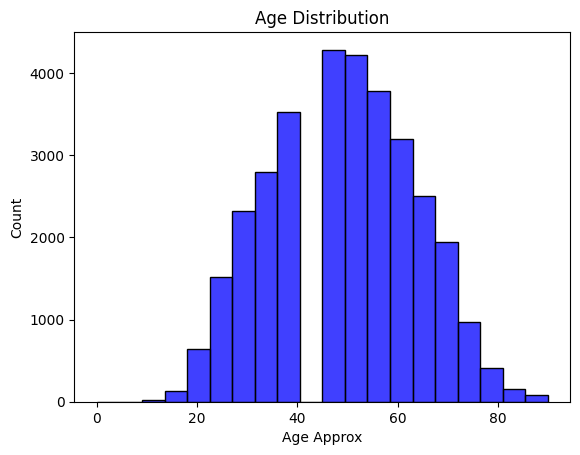

In [ ]:
# Distribution of Age
age_distribution = metadata_cleaned['age_approx'].dropna()
print(age_distribution.describe())

# Plotting the Age Distribution
sns.histplot(age_distribution, bins=20, kde=False, color='blue')
plt.title('Age Distribution')
plt.xlabel('Age Approx')
plt.ylabel('Count')
plt.show()


sex
male      16788
female    15743
Name: count, dtype: int64


<ipython-input-77-30ab14f09080>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='sex', data=metadata_cleaned, palette='Set1')


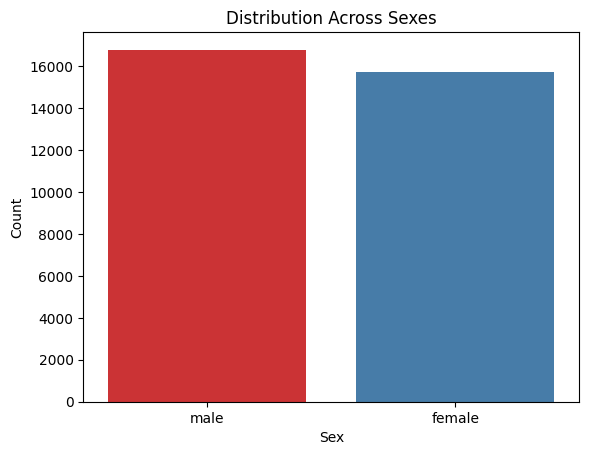

In [ ]:
# Distribution across sexes
sex_distribution = metadata_cleaned['sex'].value_counts()
print(sex_distribution)

# Plotting Sex Distribution
sns.countplot(x='sex', data=metadata_cleaned, palette='Set1')
plt.title('Distribution Across Sexes')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.show()


anatom_site_general_challenge
torso              16825
lower extremity     8399
upper extremity     4963
head/neck           1845
palms/soles          375
oral/genital         124
Name: count, dtype: int64


<ipython-input-79-a64c0ed956f4>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='anatom_site_general_challenge', data=metadata_cleaned, palette='Set3')


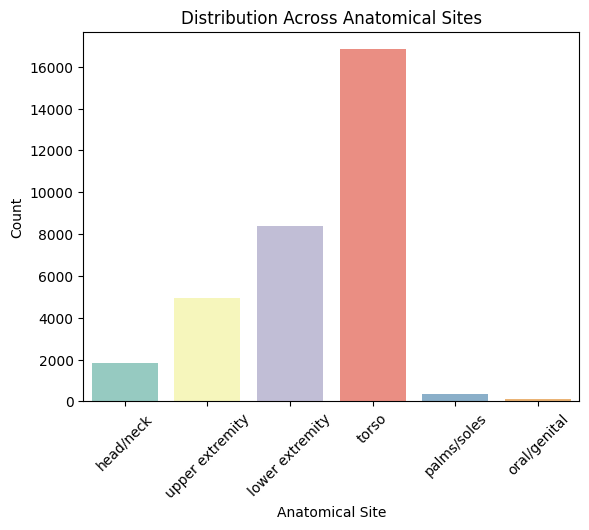

In [ ]:
# Distribution across anatomical sites
anatom_site_distribution = metadata_cleaned['anatom_site_general_challenge'].value_counts()
print(anatom_site_distribution)

# Plotting Anatomical Site Distribution
sns.countplot(x='anatom_site_general_challenge', data=metadata_cleaned, palette='Set3')
plt.title('Distribution Across Anatomical Sites')
plt.xlabel('Anatomical Site')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


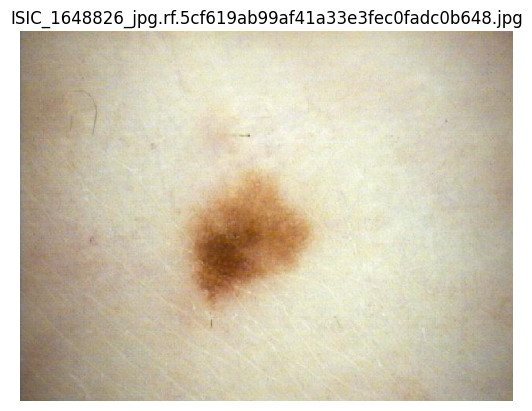

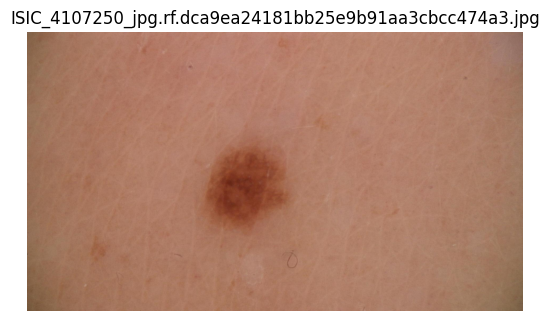

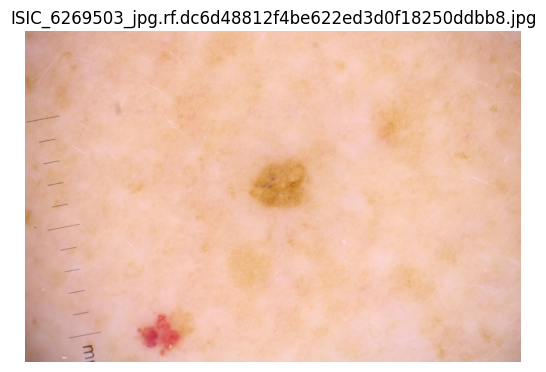

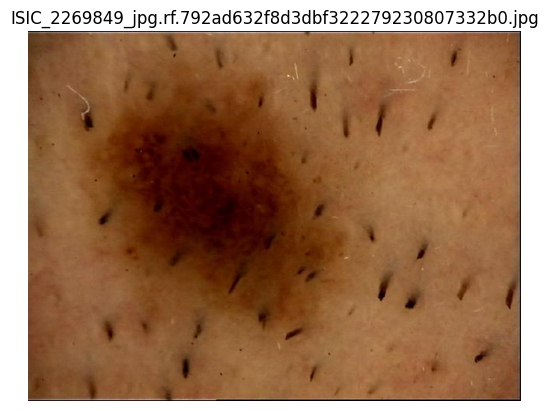

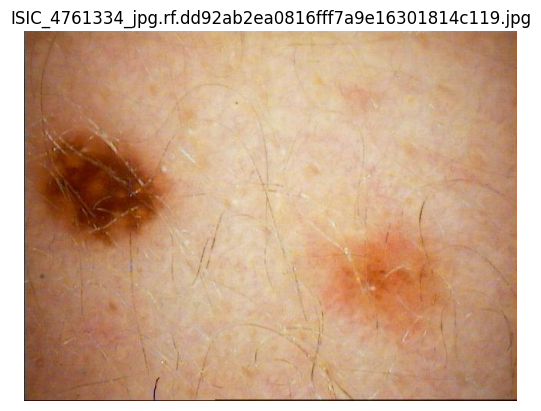

In [ ]:
import zipfile
import os
from PIL import Image
import matplotlib.pyplot as plt

# Unzip the file
zip_path = '/content/drive/MyDrive/Churchill.zip'
extract_path = '/content/Churchill/'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Display a few images from the updated path
image_folder = os.path.join(extract_path, 'Churchill/train')
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Display first few images
for image_file in image_files[:5]:  # Display first 5 images
    img_path = os.path.join(image_folder, image_file)
    img = Image.open(img_path)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_file)
    plt.show()


In [ ]:
import os
from PIL import Image
import numpy as np

# List image files in the directory
image_files = [f for f in os.listdir(extract_path) if os.path.isfile(os.path.join(extract_path, f))]

# Load and display basic properties of the first few images
image_properties = []
for image_file in image_files[:5]:  # Limiting to the first 5 images for brevity
    image_path = os.path.join(extract_path, image_file)
    with Image.open(image_path) as img:
        width, height = img.size
        mode = img.mode
        image_properties.append((image_file, width, height, mode))

print("Image properties (filename, width, height, mode):")
print(image_properties)


Image properties (filename, width, height, mode):
[]


Summary of Image Widths and Heights:
Widths - min: 640, max: 6000, mean: 4017.5850222942845
Heights - min: 480, max: 5184, mean: 2660.408492095663


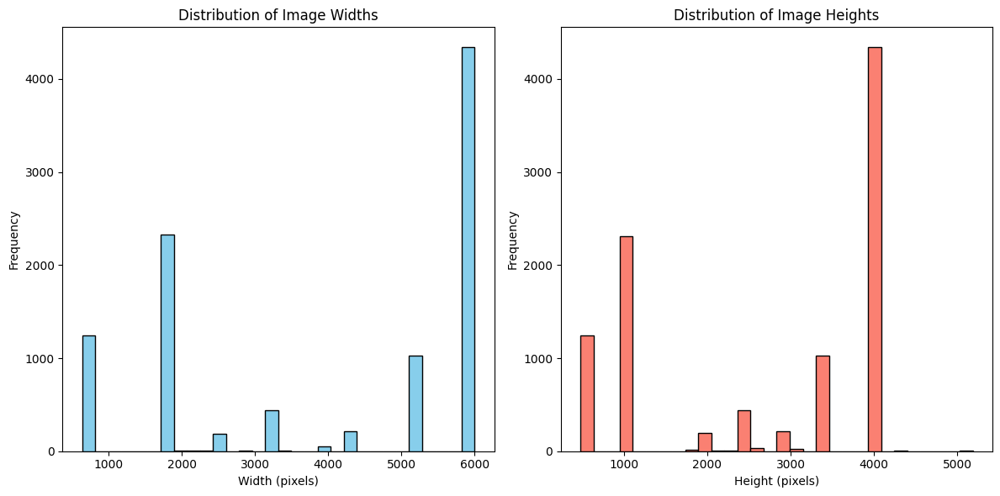

In [ ]:
import os
from PIL import Image, UnidentifiedImageError
import numpy as np
import matplotlib.pyplot as plt

# Define paths
train_folder_path = '/content/Churchill/Churchill/train'

# List image files in the directory (filtering based on common image extensions)
image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff'}
image_files = [f for f in os.listdir(train_folder_path)
               if os.path.isfile(os.path.join(train_folder_path, f)) and os.path.splitext(f)[1].lower() in image_extensions]

# Collect dimensions of all images
image_dimensions = []
for image_file in image_files:
    image_path = os.path.join(train_folder_path, image_file)
    try:
        with Image.open(image_path) as img:
            width, height = img.size
            image_dimensions.append((width, height))
    except UnidentifiedImageError:
        print(f"Warning: Skipping file {image_file} as it is not a valid image.")
    except Exception as e:
        print(f"Error: An unexpected error occurred with file {image_file}. {e}")

# Convert to NumPy array for analysis
if image_dimensions:
    image_dimensions = np.array(image_dimensions)
    widths = image_dimensions[:, 0]  # Widths are in the first column
    heights = image_dimensions[:, 1]  # Heights are in the second column

    print("Summary of Image Widths and Heights:")
    print(f"Widths - min: {widths.min()}, max: {widths.max()}, mean: {widths.mean()}")
    print(f"Heights - min: {heights.min()}, max: {heights.max()}, mean: {heights.mean()}")

    # Plot distribution of image widths and heights
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.hist(widths, bins=30, color='skyblue', edgecolor='black')
    plt.title('Distribution of Image Widths')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Frequency')

    plt.subplot(1, 2, 2)
    plt.hist(heights, bins=30, color='salmon', edgecolor='black')
    plt.title('Distribution of Image Heights')
    plt.xlabel('Height (pixels)')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()
else:
    print("No valid images found for analysis.")


Annotations loaded successfully


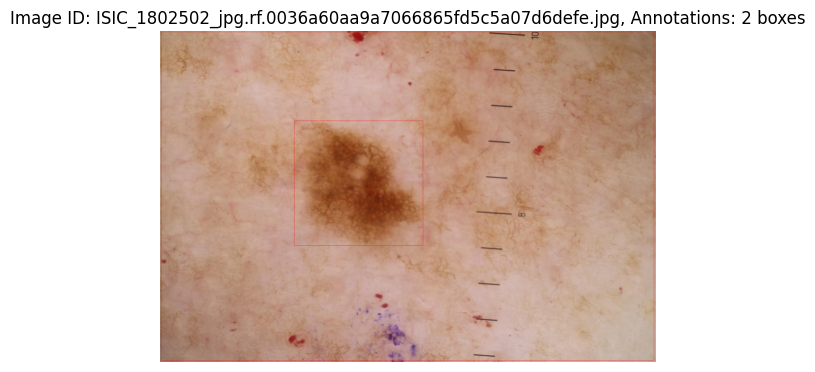

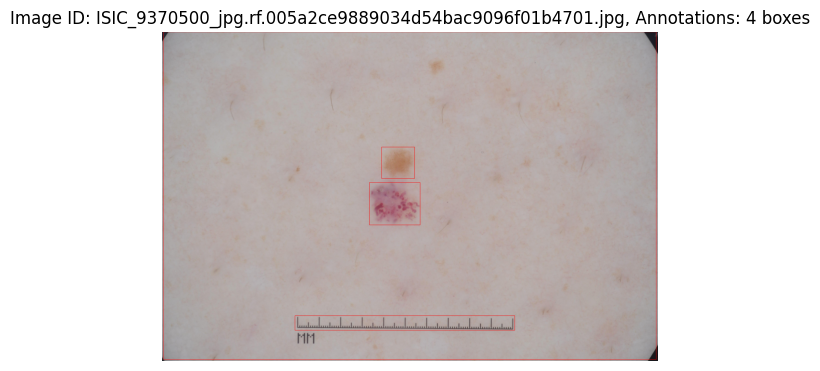

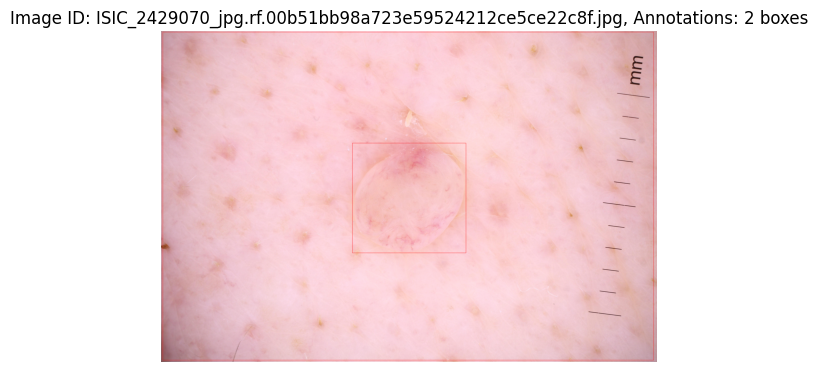

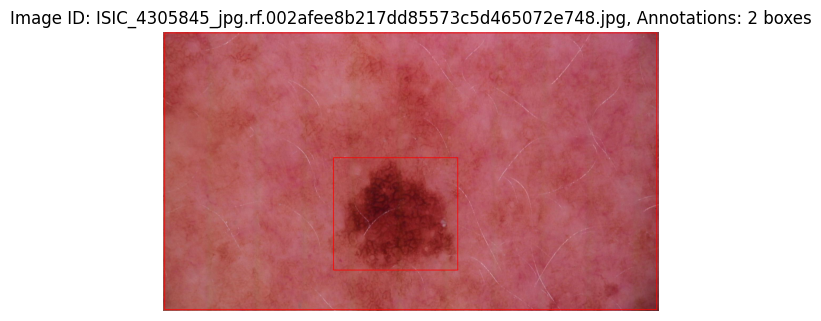

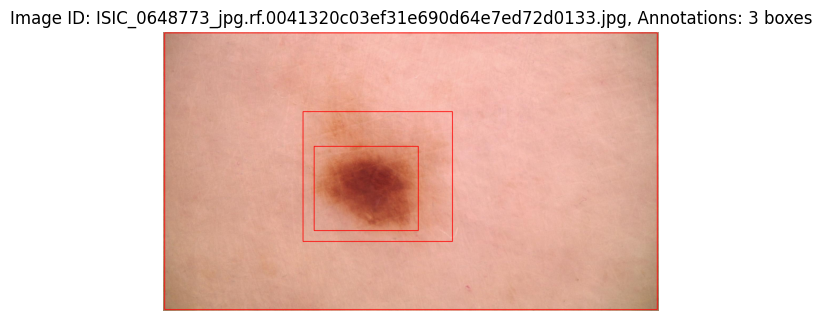

In [ ]:
import zipfile
import os
import json
import matplotlib.pyplot as plt
import cv2


train_folder_path = '/content/Churchill/Churchill/train'
annotations_file_path = os.path.join(train_folder_path, '_annotations.coco.json')





# Step 2: Load and parse the annotations file
with open(annotations_file_path, 'r') as f:
    annotations = json.load(f)

print("Annotations loaded successfully")

# Display annotations
def display_annotations(annotations, image_dir, sample_size=5):
    image_annotations = annotations['images']
    for image_info in image_annotations[:sample_size]:
        image_id = image_info['file_name']
        image_path = os.path.join(image_dir, image_id)

        if not os.path.exists(image_path):
            print(f"Image file {image_path} does not exist")
            continue

        # Read and display the image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Failed to load image {image_path}")
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get annotations for the current image
        image_annotations = [anno for anno in annotations['annotations'] if anno['image_id'] == image_info['id']]

        # Plot each annotation
        for annotation in image_annotations:
            bbox = annotation['bbox']
            x, y, w, h = bbox
            cv2.rectangle(image, (int(x), int(y)), (int(x + w), int(y + h)), (255, 0, 0), 2)

        plt.figure()
        plt.imshow(image)
        plt.title(f"Image ID: {image_id}, Annotations: {len(image_annotations)} boxes")
        plt.axis('off')

    plt.show()

# Display annotations
display_annotations(annotations, train_folder_path, sample_size=5)


In [ ]:
import os
import torch
from PIL import Image
import json

# Define paths
extracted_path = '/content/Churchill/Churchill'
data_dir = os.path.join(extracted_path, 'train')
annotation_file = os.path.join(data_dir, '_annotations.coco.json')

# Load the COCO dataset annotations
with open(annotation_file) as f:
    dataset = json.load(f)

# Function to lazily load images and target annotations
def get_data(data_dir, dataset, max_images=10):
    images = []
    targets = []
    count = 0
    for img in dataset['images']:
        if count >= max_images:
            break

        img_path = os.path.join(data_dir, img['file_name'])

        if not os.path.exists(img_path):
            print(f"Image file {img_path} does not exist.")
            continue

        try:
            image = Image.open(img_path).convert("RGB")
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            continue

        img_id = img['id']

        # Collect all annotations for the image
        annotations = [ann for ann in dataset['annotations'] if ann['image_id'] == img_id]
        boxes = []
        labels = []
        for ann in annotations:
            bbox = ann['bbox']
            boxes.append([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]])  # Convert to [xmin, ymin, xmax, ymax]
            labels.append(ann['category_id'])  # Assuming category_id corresponds to the object class

        if boxes:  # Only consider images with at least one box
            images.append(image)
            targets.append({'boxes': torch.tensor(boxes, dtype=torch.float32),
                            'labels': torch.tensor(labels, dtype=torch.int64)})
        else:
            print(f"No annotations found for image {img_path}")

        count += 1
    return images, targets

images, targets = get_data(data_dir, dataset)



In [ ]:

images, targets = get_data(data_dir, dataset, max_images=50)


In [ ]:
import os
import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.transforms import functional as F
from PIL import Image
import json

Faster R-CNN

In [ ]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Load a pre-trained model and replace the head
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 2)

# Move model to GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

# Set up the optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.0007)

In [ ]:
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    for images, targets in data_loader:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # Backward pass
        losses.backward()

        # Clip gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0, norm_type=2)

        optimizer.step()

        epoch_loss += losses.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")


Epoch 1/100, Loss: 2.6414
Epoch 2/100, Loss: 2.5401
Epoch 3/100, Loss: 2.4594
Epoch 4/100, Loss: 2.4336
Epoch 5/100, Loss: 2.2893
Epoch 6/100, Loss: 2.3617
Epoch 7/100, Loss: 2.3597
Epoch 8/100, Loss: 2.4728
Epoch 9/100, Loss: 2.3744
Epoch 10/100, Loss: 2.1732
Epoch 11/100, Loss: 2.0667
Epoch 12/100, Loss: 1.9898
Epoch 13/100, Loss: 1.9241
Epoch 14/100, Loss: 1.8270
Epoch 15/100, Loss: 2.0665
Epoch 16/100, Loss: 1.9689
Epoch 17/100, Loss: 2.0477
Epoch 18/100, Loss: 1.8065
Epoch 19/100, Loss: 1.5618
Epoch 20/100, Loss: 1.5363
Epoch 21/100, Loss: 1.6401
Epoch 22/100, Loss: 1.6241
Epoch 23/100, Loss: 1.5860
Epoch 24/100, Loss: 1.4782
Epoch 25/100, Loss: 1.4029
Epoch 26/100, Loss: 1.5351
Epoch 27/100, Loss: 1.5090
Epoch 28/100, Loss: 1.4590
Epoch 29/100, Loss: 1.4161
Epoch 30/100, Loss: 1.2458
Epoch 31/100, Loss: 1.3079
Epoch 32/100, Loss: 1.3151
Epoch 33/100, Loss: 1.3108
Epoch 34/100, Loss: 1.4960
Epoch 35/100, Loss: 1.3909
Epoch 36/100, Loss: 1.3260
Epoch 37/100, Loss: 1.2357
Epoch 38/1

In [ ]:
import torch
from torchvision.ops import box_iou

# Ensure the model is in evaluation mode
model.eval()

# Dummy data loader for evaluation
eval_data_loader = DataLoader(lesion_dataset, batch_size=2, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Function to evaluate the model
def evaluate(model, data_loader, device):
    model.eval()
    all_boxes = []
    all_labels = []
    all_scores = []
    all_gt_boxes = []

    with torch.no_grad():
        for images, targets in data_loader:
            images = list(image.to(device) for image in images)
            outputs = model(images)

            for output, target in zip(outputs, targets):
                all_boxes.append(output['boxes'].cpu())
                all_labels.append(output['labels'].cpu())
                all_scores.append(output['scores'].cpu())
                all_gt_boxes.append(target['boxes'].cpu())

    # Example metric: IoU for each prediction
    ious = []
    for pred_boxes, gt_boxes in zip(all_boxes, all_gt_boxes):
        if len(gt_boxes) == 0:
            continue
        ious.append(box_iou(pred_boxes, gt_boxes).max(dim=1)[0].mean().item())

    print(f"Mean IoU: {sum(ious)/len(ious):.4f}")

# Call the evaluation function
evaluate(model, eval_data_loader, device)


Mean IoU: 0.9013


Image 0:
Predicted boxes: tensor([[1643.5223, 1071.9386, 3183.6494, 2630.2095],
        [   0.0000,    0.0000, 5968.9404, 4000.0000]])
Ground truth boxes: tensor([[  19.,   11., 5975., 3982.],
        [1624., 1085., 3181., 2592.]])


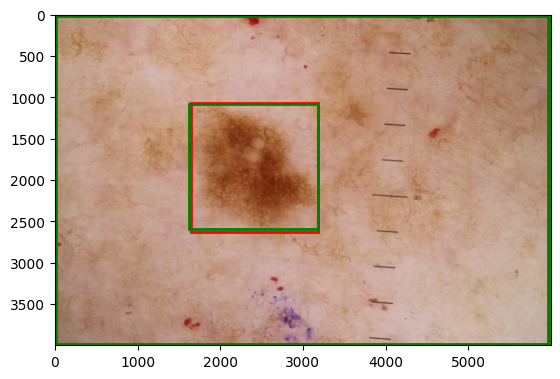

Image 1:
Predicted boxes: tensor([[1788.7822, 1307.2517, 2237.0454, 1675.4659],
        [1899.0731, 1002.5474, 2180.2878, 1275.6449],
        [   0.0000,    0.0000, 4288.0000, 2848.0000],
        [1249.0553, 2461.0452, 2980.4136, 2578.9797],
        [1407.7698, 2375.2275, 2987.1252, 2667.1809]])
Ground truth boxes: tensor([[  13.,    7., 4272., 2834.],
        [1793., 1307., 2231., 1673.],
        [1898., 1001., 2183., 1272.],
        [1149., 2456., 3049., 2582.]])


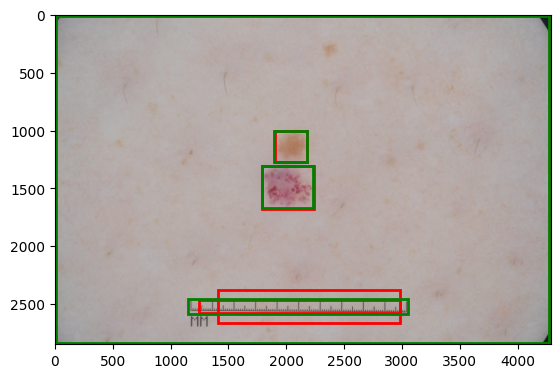

Image 0:
Predicted boxes: tensor([[2326.4321, 1341.6902, 3679.4558, 2671.3696],
        [   0.0000,    0.0000, 6000.0000, 3993.2664],
        [2402.2441, 1429.6963, 3002.4761, 2653.1089]])
Ground truth boxes: tensor([[  22.,   13., 5959., 3977.],
        [2315., 1354., 3689., 2681.]])


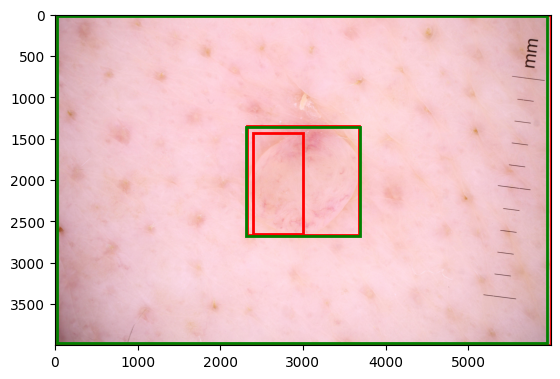

Image 1:
Predicted boxes: tensor([[ 651.7180,  474.7968, 1105.9948,  901.1154],
        [   4.9999,   10.9194, 1872.0000, 1039.2952],
        [ 596.4251,  174.0320, 1226.8795,  960.1395]])
Ground truth boxes: tensor([[   6.,    3., 1863., 1047.],
        [ 643.,  474., 1112.,  898.]])


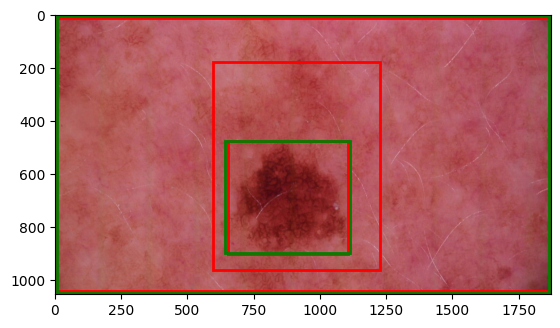

Image 0:
Predicted boxes: tensor([[ 527.1407,  287.0484, 1097.1377,  796.4156],
        [ 575.4937,  433.4438,  972.9377,  759.0183],
        [   6.5910,    0.0000, 1864.6863, 1053.0000],
        [ 805.9720,  332.5511, 1063.1682,  565.3757],
        [ 359.3927,  239.1740, 1318.5347,  872.0004]])
Ground truth boxes: tensor([[ 570.,  431.,  963.,  749.],
        [   6.,    3., 1865., 1047.],
        [ 528.,  300., 1092.,  790.]])


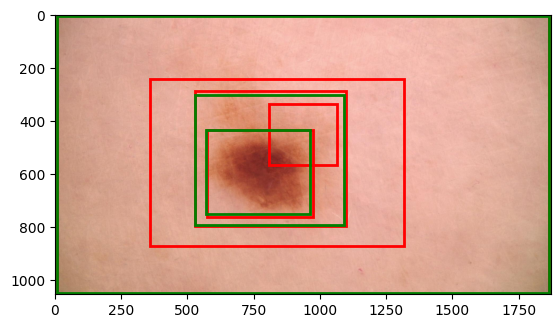

Image 1:
Predicted boxes: tensor([[152.6093, 225.0250, 481.8378, 405.7264],
        [  1.3570,   1.9408, 637.6913, 467.8860]])
Ground truth boxes: tensor([[  2.,   1., 637., 477.],
        [154., 224., 478., 406.]])


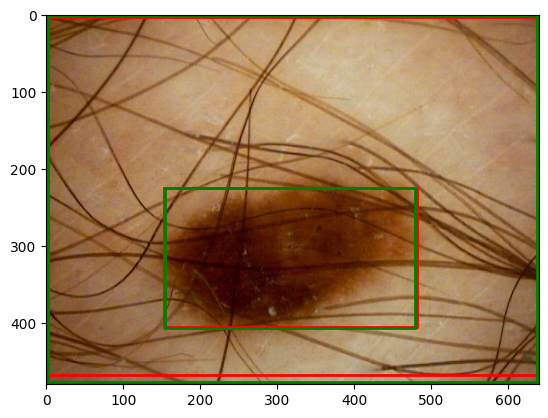

Image 0:
Predicted boxes: tensor([[ 850.4514,  171.9362, 1179.2982,  653.9468],
        [ 144.6413,   87.2941,  246.8410,  361.9793],
        [   0.0000,    0.0000, 1859.0804, 1051.2124]])
Ground truth boxes: tensor([[ 846.,  169., 1185.,  651.],
        [   6.,    3., 1864., 1047.],
        [ 147.,   90.,  244.,  370.]])


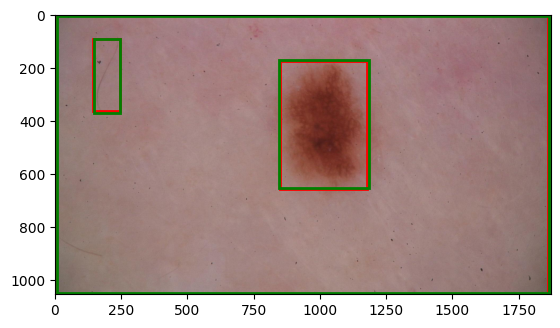

Image 1:
Predicted boxes: tensor([[2549.2512, 1440.9673, 3539.5415, 2725.3105],
        [   0.0000,    0.0000, 6000.0000, 4000.0000]])
Ground truth boxes: tensor([[  18.,   10., 5978., 3983.],
        [2547., 1448., 3551., 2693.]])


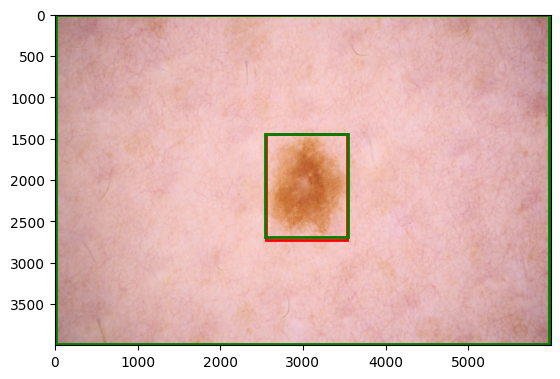

Image 0:
Predicted boxes: tensor([[2335.9663, 1436.1260, 3558.7334, 2554.7878],
        [ 268.5653,  340.8386,  659.5757,  607.7431],
        [3150.9751, 1081.0118, 3477.5442, 1372.9059],
        [   0.0000,    0.0000, 5964.2261, 3997.0422]])
Ground truth boxes: tensor([[  18.,   10., 5979., 3983.],
        [2340., 1440., 3568., 2576.],
        [3152., 1075., 3475., 1364.],
        [ 269.,  336.,  667.,  607.]])


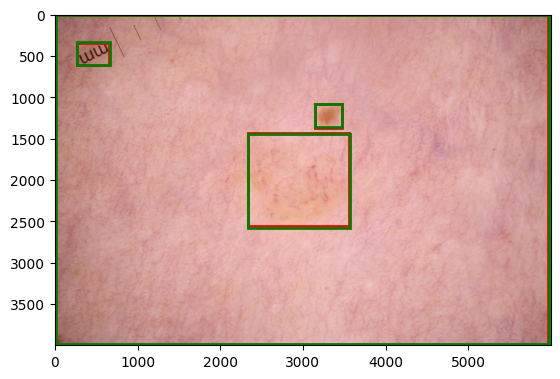

Image 1:
Predicted boxes: tensor([[1678.0129,  930.1071, 2341.3674, 1597.4709],
        [3805.1685, 1215.5195, 4678.7886, 2148.4209],
        [   0.0000,    0.0000, 6000.0000, 4000.0000]])
Ground truth boxes: tensor([[  24.,   14., 5977., 3982.],
        [3794., 1225., 4688., 2111.],
        [1672.,  939., 2327., 1570.]])


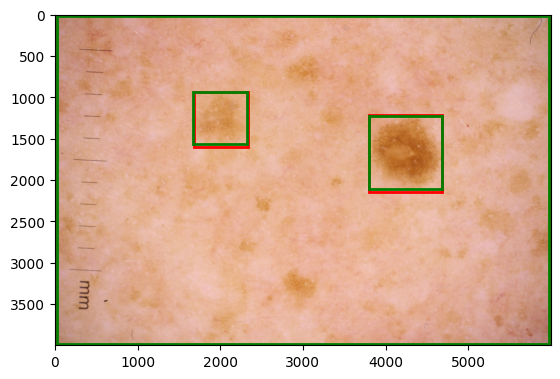

Image 0:
Predicted boxes: tensor([[2724.4602,  929.4945, 4402.1348, 3007.7900],
        [2034.8276, 2691.9968, 2736.4028, 3423.3152],
        [   0.0000,    0.0000, 5980.7764, 4000.0000],
        [1438.4938,  659.0514, 5027.9453, 3568.1768],
        [2103.5300, 3054.8057, 2713.9502, 3373.1448]])
Ground truth boxes: tensor([[  19.,   11., 5977., 3980.],
        [2704.,  922., 4397., 3012.],
        [2035., 2696., 2731., 3403.]])


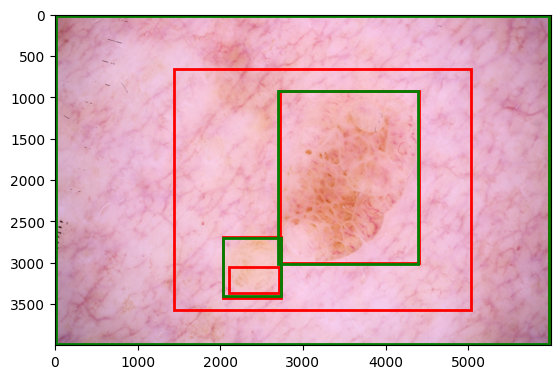

Image 1:
Predicted boxes: tensor([[2480.3169, 1495.7578, 3480.8110, 3088.0083],
        [2606.6111, 2392.4951, 3085.2195, 3066.2373],
        [   0.0000,    0.0000, 6000.0000, 4000.0000]])
Ground truth boxes: tensor([[  19.,   11., 5977., 3982.],
        [2572., 2383., 3093., 3058.],
        [2450., 1476., 3495., 3074.]])


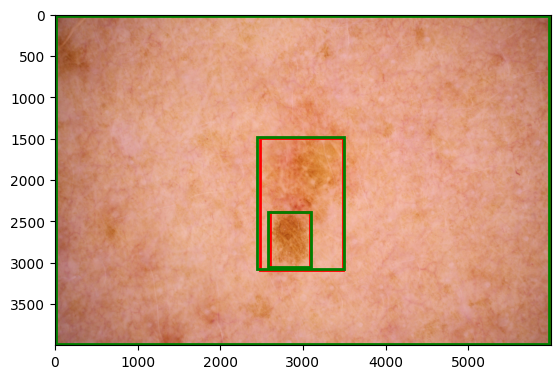

Image 0:
Predicted boxes: tensor([[2297.2251, 1493.5376, 3776.8264, 2689.3250],
        [   0.0000,    0.0000, 5887.4165, 3990.9453]])
Ground truth boxes: tensor([[  21.,   12., 5973., 3980.],
        [2329., 1477., 3739., 2684.]])


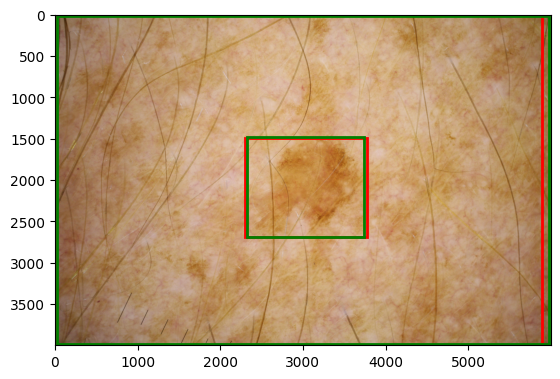

Image 1:
Predicted boxes: tensor([[2655.9524, 1433.5593, 3474.9277, 2675.0049],
        [2593.1055, 1409.0607, 4517.2759, 2761.2107],
        [   0.0000,    0.0000, 5940.1816, 4000.0000]])
Ground truth boxes: tensor([[  21.,   12., 5972., 3979.],
        [2658., 1464., 3483., 2629.],
        [2627., 1442., 4525., 2732.]])


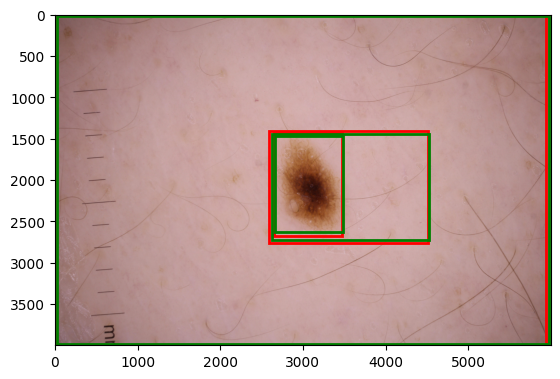

Image 0:
Predicted boxes: tensor([[  60.2240,   10.0826, 5901.7798, 4000.0000]])
Ground truth boxes: tensor([[  19.,   13., 5975., 3983.]])


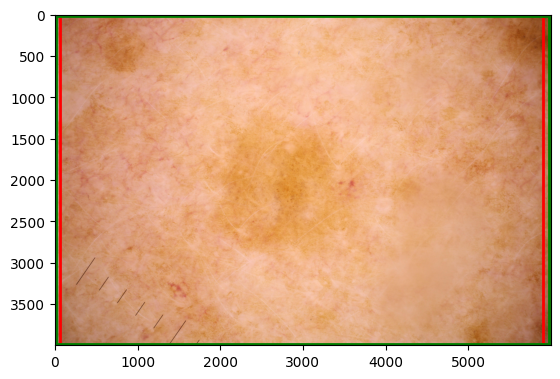

Image 1:
Predicted boxes: tensor([[  0.0000,   0.0000, 638.6137, 480.0000],
        [181.8260,  92.6017, 506.6143, 457.1137]])
Ground truth boxes: tensor([[168.,  96., 513., 459.],
        [  3.,   1., 636., 477.]])


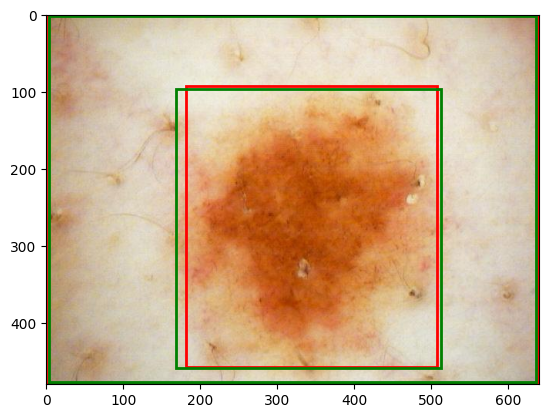

Image 0:
Predicted boxes: tensor([[ 108.5036,  101.7242,  676.7742, 3717.8369],
        [   0.0000,    0.0000, 5931.2646, 4000.0000]])
Ground truth boxes: tensor([[  24.,   13., 5974., 3982.],
        [ 103.,  278.,  679., 3511.]])


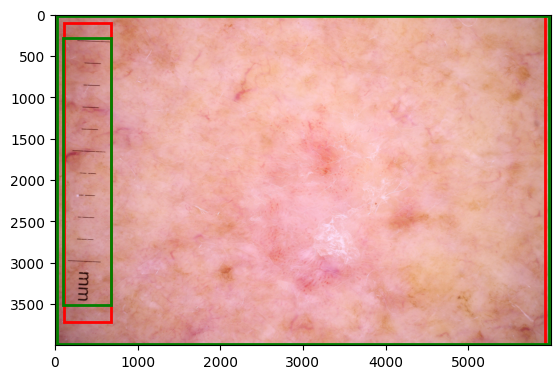

Image 1:
Predicted boxes: tensor([[  19.7940,    0.0000, 5990.3101, 4000.0000]])
Ground truth boxes: tensor([[  20.,   10., 5974., 3982.]])


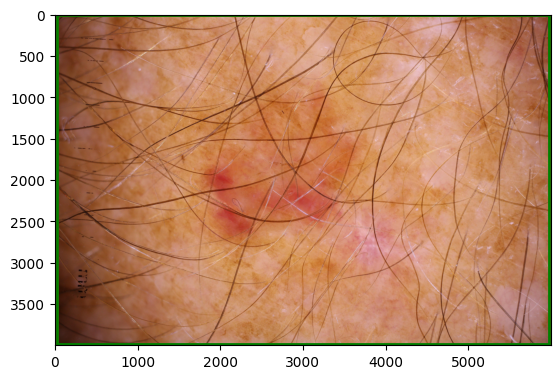

Image 0:
Predicted boxes: tensor([[335.7735,  86.8813, 476.9091, 209.3033],
        [188.5879, 213.1145, 293.8718, 285.2303],
        [362.7432, 407.3054, 412.0874, 479.9111],
        [305.0828,   3.5795, 397.0497, 136.6987],
        [ 19.1991,   0.0000, 638.1249, 480.0000],
        [190.7072,  76.0418, 531.6792, 461.8066],
        [241.4168, 188.3082, 448.2666, 453.2006],
        [182.7049, 193.5862, 401.2884, 311.4927]])
Ground truth boxes: tensor([[  1.,   2., 636., 476.],
        [186.,  84., 533., 473.],
        [363., 408., 411., 478.],
        [335.,  89., 476., 205.],
        [188., 214., 291., 284.],
        [302.,   3., 394., 139.]])


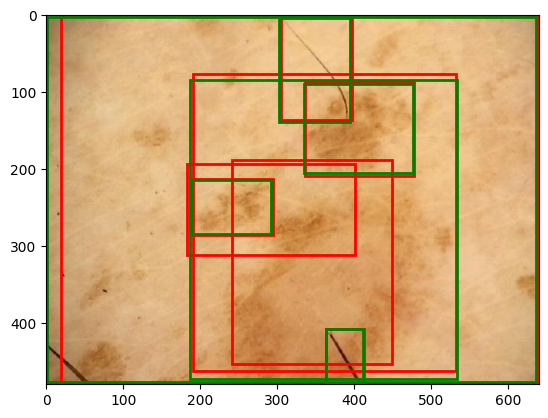

Image 1:
Predicted boxes: tensor([[2645.5955, 1437.3668, 3399.1807, 2504.9607],
        [   0.0000,    0.0000, 5970.9248, 4000.0000]])
Ground truth boxes: tensor([[  17.,   11., 5975., 3978.],
        [2635., 1435., 3387., 2483.]])


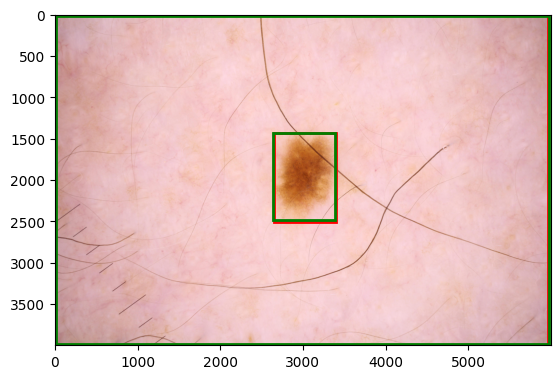

Image 0:
Predicted boxes: tensor([[ 603.7435,   34.7673, 1209.2911,  798.1453],
        [   0.0000,    0.0000, 1872.0000, 1053.0000]])
Ground truth boxes: tensor([[ 589.,   37., 1229.,  800.],
        [   6.,    5., 1864., 1046.]])


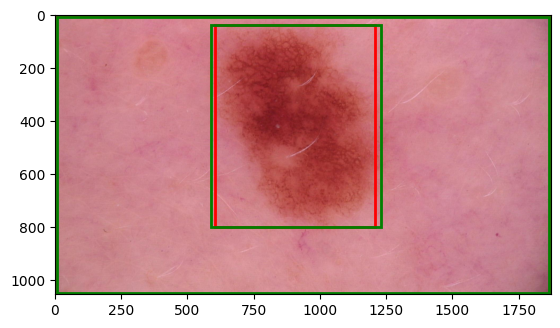

Image 1:
Predicted boxes: tensor([[ 561.9506,  271.2581, 1201.5198,  832.6926],
        [   0.0000,    0.0000, 1872.0000, 1053.0000],
        [ 724.5944,  511.7530,  886.1417,  676.1345],
        [ 658.8307,  443.5157, 1209.4963,  707.6548],
        [ 573.7938,  296.0509,  930.2171,  797.2791]])
Ground truth boxes: tensor([[   5.,    4., 1865., 1046.],
        [ 554.,  270., 1210.,  827.],
        [ 724.,  515.,  882.,  675.]])


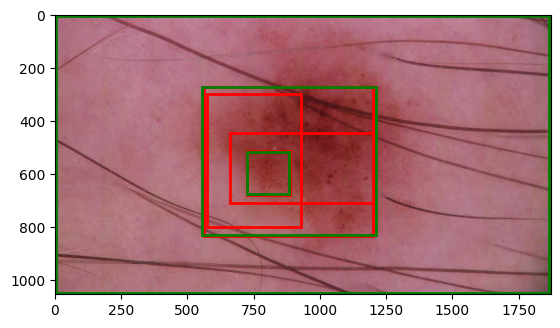

Image 0:
Predicted boxes: tensor([[1015.1646, 1285.9165, 2474.9355, 2925.7947],
        [  22.0762,   28.0919, 3945.0989, 3024.0000],
        [ 866.2495,  194.2480, 2769.2969, 2963.7817],
        [1634.6619,  479.3076, 2511.1021, 2653.3213],
        [1251.6788,  355.5002, 2433.8372, 1680.8938]])
Ground truth boxes: tensor([[ 934.,  181., 2635., 2893.],
        [  16.,   11., 4011., 3009.],
        [1032., 1302., 2451., 2886.]])


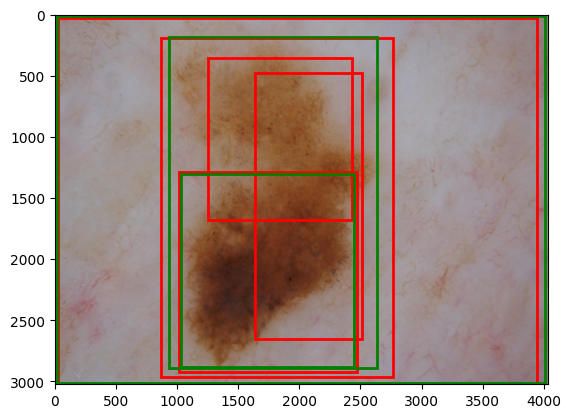

Image 1:
Predicted boxes: tensor([[ 170.2542,   96.2599,  730.9902, 3705.1709],
        [   0.0000,   39.8347, 5882.5366, 4000.0000]])
Ground truth boxes: tensor([[  22.,   12., 5976., 3983.],
        [ 176.,  314.,  731., 3563.]])


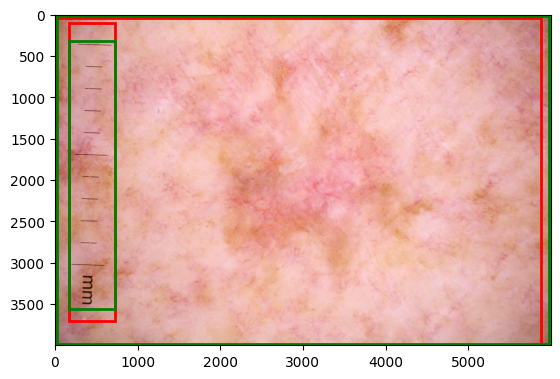

Image 0:
Predicted boxes: tensor([[1.9221e+03, 1.4224e+03, 2.1889e+03, 1.7657e+03],
        [2.2660e+03, 1.1753e+00, 3.0340e+03, 1.3264e+03],
        [4.6764e+02, 3.2753e+02, 8.6123e+02, 1.5796e+03],
        [0.0000e+00, 0.0000e+00, 3.2508e+03, 2.4480e+03],
        [2.4774e+03, 8.5966e+01, 2.8681e+03, 1.3413e+03],
        [4.7043e+02, 9.4202e+02, 7.5788e+02, 1.5814e+03],
        [2.4502e+03, 6.0879e+02, 2.8027e+03, 1.3407e+03],
        [2.2705e+03, 1.5976e+02, 2.5194e+03, 7.5147e+02]])
Ground truth boxes: tensor([[  12.,    6., 3249., 2437.],
        [1925., 1425., 2179., 1756.],
        [ 466.,  343.,  861., 1580.],
        [2231.,   17., 3015., 1298.],
        [2472.,   81., 2876., 1288.]])


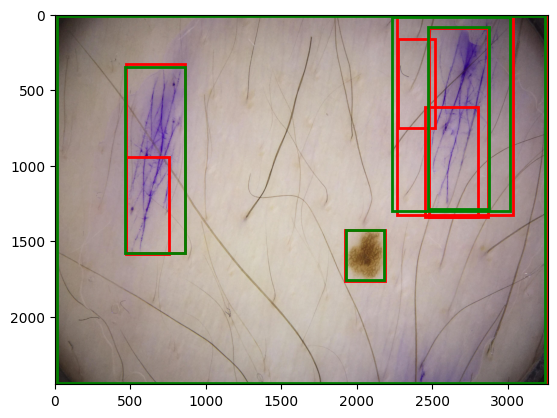

Image 1:
Predicted boxes: tensor([[201.6166,  77.3819, 463.5613, 375.9063],
        [  0.0000,   0.0000, 629.6675, 479.8437]])
Ground truth boxes: tensor([[196.,  76., 465., 375.],
        [  2.,   2., 636., 477.]])


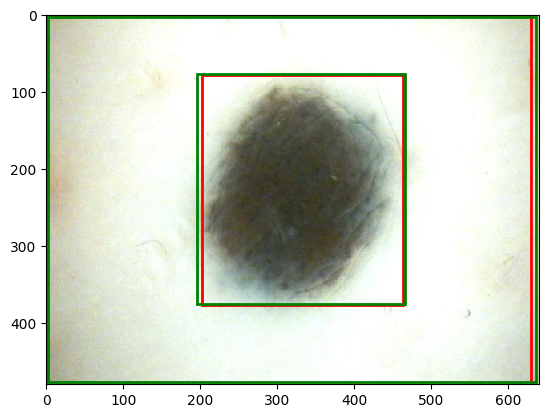

Image 0:
Predicted boxes: tensor([[   0.0000,    0.0000, 1872.0000, 1047.9053]])
Ground truth boxes: tensor([[   6.,    3., 1864., 1047.]])


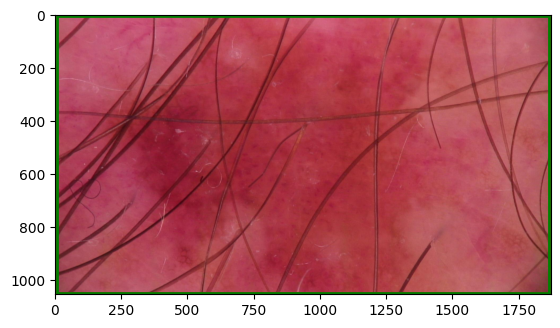

Image 1:
Predicted boxes: tensor([[ 992.6451,  692.6158, 2685.8567, 2382.3181],
        [1029.8970,  976.5203, 1648.1925, 1835.7853],
        [  15.6612,    0.0000, 4268.3735, 2837.8306],
        [1308.2250, 2301.8132, 3189.8181, 2660.2456]])
Ground truth boxes: tensor([[  13.,   11., 4271., 2836.],
        [ 986.,  690., 2720., 2415.],
        [1306., 2302., 3195., 2660.],
        [1040., 1005., 1647., 1820.]])


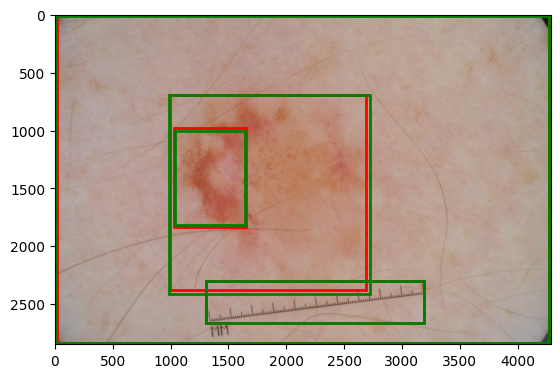

Image 0:
Predicted boxes: tensor([[1160.3514,  667.5468, 2193.6936, 1756.8486],
        [  14.5596,   16.8225, 3231.2056, 2448.0000]])
Ground truth boxes: tensor([[1153.,  661., 2205., 1755.],
        [   9.,    5., 3252., 2438.]])


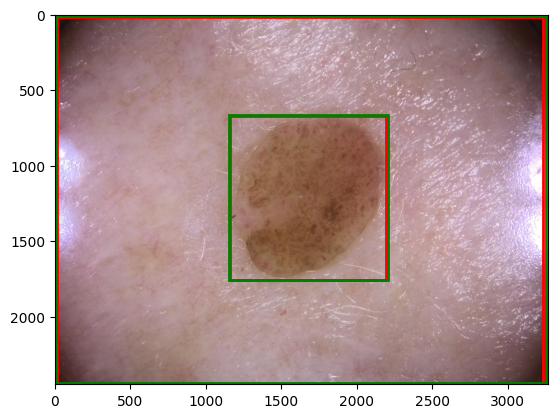

Image 1:
Predicted boxes: tensor([[   0.0000,    0.0000, 1869.2852, 1053.0000]])
Ground truth boxes: tensor([[   6.,    2., 1863., 1047.]])


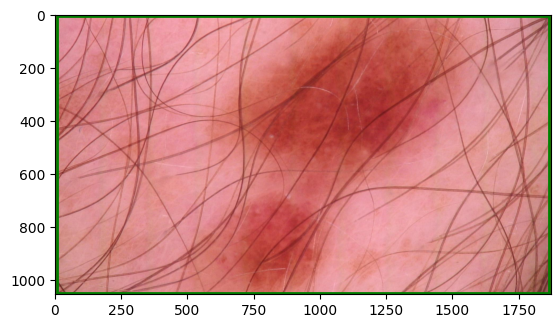

Image 0:
Predicted boxes: tensor([[2396.7954, 1762.5378, 3324.4453, 2482.1421],
        [  15.4327,    0.0000, 5948.1094, 4000.0000]])
Ground truth boxes: tensor([[  20.,   13., 5977., 3980.],
        [2393., 1779., 3321., 2446.]])


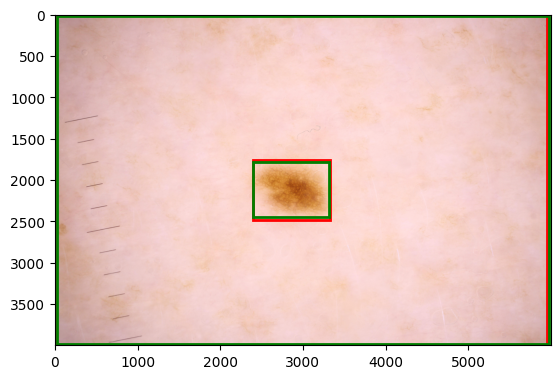

Image 1:
Predicted boxes: tensor([[2238.5811,  858.3450, 4482.7290, 3075.7434],
        [  28.8510,    0.0000, 5988.4873, 4000.0000],
        [2654.6814, 1314.9017, 4098.7803, 2667.6489]])
Ground truth boxes: tensor([[2570., 1329., 4149., 2677.],
        [  23.,   16., 5975., 3982.],
        [2230.,  866., 4465., 3058.]])


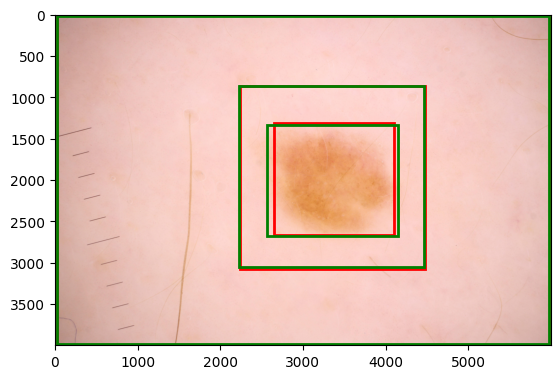

Image 0:
Predicted boxes: tensor([[ 238.7877, 2998.4446,  385.7133, 3404.4321],
        [2518.5867, 1574.2668, 3326.5042, 2424.2747],
        [  18.6597,    0.0000, 5985.6562, 4000.0000]])
Ground truth boxes: tensor([[2499., 1583., 3332., 2402.],
        [  20.,   12., 5979., 3982.],
        [ 236., 3008.,  386., 3393.]])


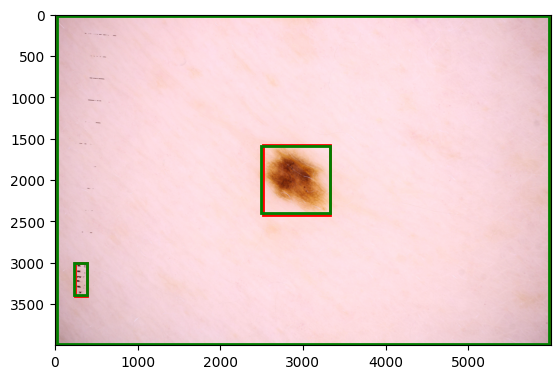

Image 1:
Predicted boxes: tensor([[2617.7632, 1574.5251, 4094.3823, 2853.4500],
        [2632.1116, 1584.2568, 3351.8228, 2265.2480],
        [ 132.4335,    0.0000, 5940.2437, 3991.5601]])
Ground truth boxes: tensor([[  18.,   11., 5977., 3982.],
        [2632., 1591., 3351., 2254.],
        [2609., 1576., 4092., 2835.]])


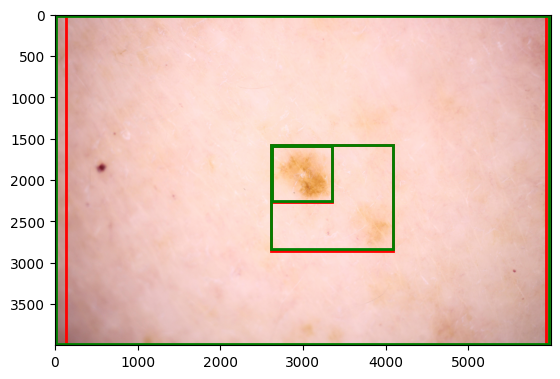

Image 0:
Predicted boxes: tensor([[2271.5312, 1270.0623, 3560.2246, 2483.6731],
        [   0.0000,    0.0000, 5962.9814, 4000.0000]])
Ground truth boxes: tensor([[  22.,   13., 5972., 3980.],
        [2288., 1270., 3522., 2522.]])


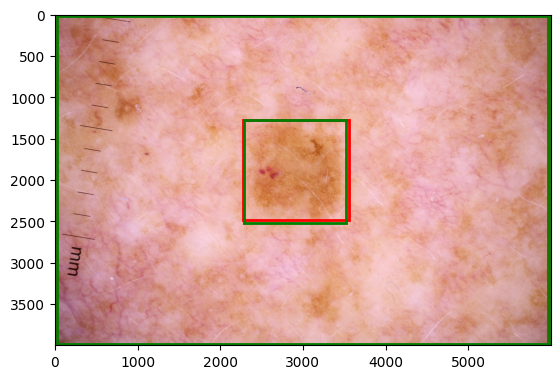

Image 1:
Predicted boxes: tensor([[161.3383,  89.2084, 433.7619, 394.2386],
        [  5.3559,   0.0000, 636.5661, 473.8746]])
Ground truth boxes: tensor([[156.,  92., 436., 398.],
        [  2.,   1., 636., 477.]])


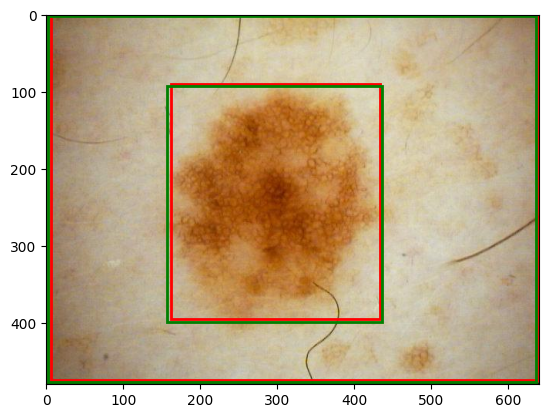

Image 0:
Predicted boxes: tensor([[247.0837, 220.7529, 317.1867, 279.9036],
        [ 72.4898, 157.0651,  90.9548, 182.0724],
        [ 10.3211,  15.4000, 613.3008, 465.6914]])
Ground truth boxes: tensor([[ 22.,  33., 605., 469.],
        [ 72., 157.,  91., 182.],
        [248., 220., 316., 280.]])


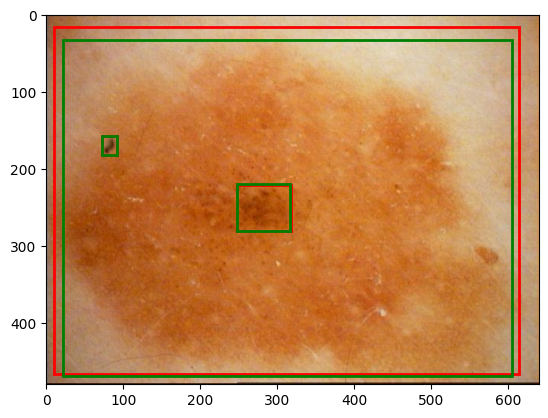

Image 1:
Predicted boxes: tensor([[3606.7046,   13.7794, 5173.9419, 1807.6960],
        [2122.4165, 1088.1127, 3177.1807, 2195.3284],
        [   0.0000,    6.5588, 5184.0000, 3439.0212],
        [2367.4556,   54.8228, 4983.2393, 2315.0608]])
Ground truth boxes: tensor([[2.1210e+03, 1.0730e+03, 3.1750e+03, 2.2140e+03],
        [1.4000e+01, 9.0000e+00, 5.1640e+03, 3.4400e+03],
        [3.5630e+03, 3.0000e+00, 5.1740e+03, 1.7890e+03]])


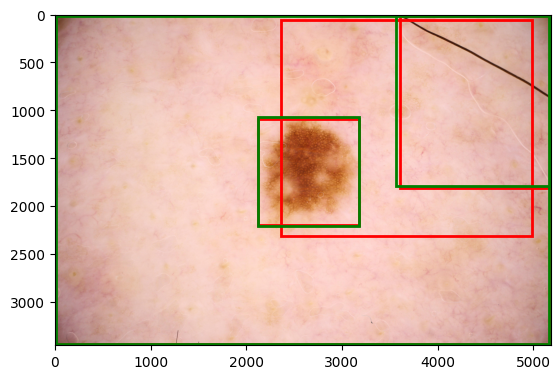

Image 0:
Predicted boxes: tensor([[109.1128,  21.0668, 631.2143, 470.0682]])
Ground truth boxes: tensor([[148.,  39., 619., 441.]])


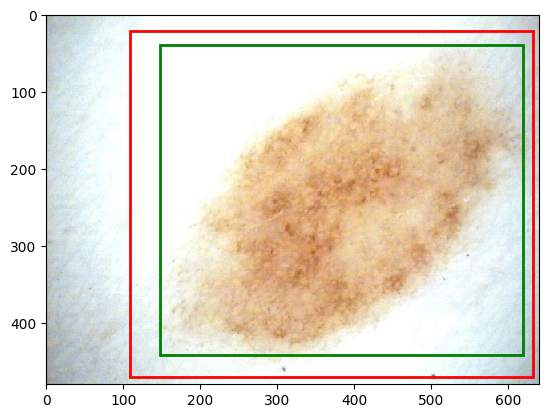

Image 1:
Predicted boxes: tensor([[  11.0927,    8.9845, 3204.4133, 2441.5759],
        [1168.4048,  875.3098, 2031.4291, 1725.9178],
        [ 718.4999,  386.6869, 2464.3352, 2266.7332],
        [   0.0000, 1494.9728, 3171.7434, 2448.0000]])
Ground truth boxes: tensor([[  10.,    8., 3248., 2437.],
        [1151.,  875., 2039., 1734.],
        [ 703.,  409., 2471., 2282.]])


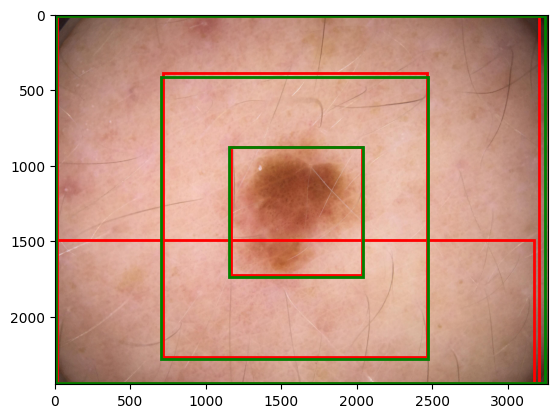

Image 0:
Predicted boxes: tensor([[1.5253e+03, 5.0861e+02, 1.7035e+03, 6.8931e+02],
        [7.2036e+02, 7.3407e+02, 1.1060e+03, 1.1030e+03],
        [1.5361e+00, 5.8683e+00, 2.5866e+03, 1.9021e+03],
        [1.2706e+03, 8.5746e+02, 1.4599e+03, 1.1256e+03],
        [1.2357e+03, 7.5641e+02, 1.5531e+03, 1.1286e+03]])
Ground truth boxes: tensor([[   8.,    5., 2582., 1928.],
        [1234.,  762., 1545., 1118.],
        [1274.,  864., 1457., 1113.],
        [1523.,  505., 1702.,  685.],
        [ 718.,  744., 1110., 1093.]])


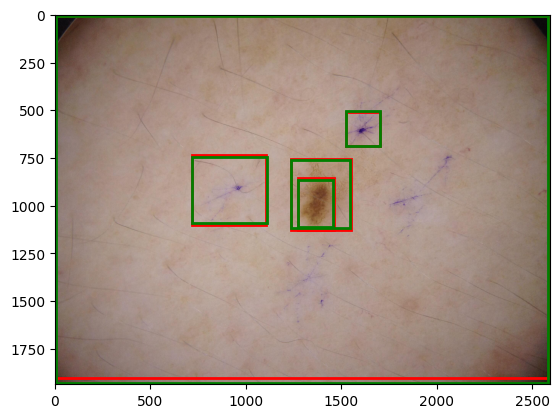

Image 1:
Predicted boxes: tensor([[314.3860,  55.6029, 540.5275, 323.3566],
        [ 17.6109,   4.5492, 630.5549, 475.2727],
        [188.2981,  35.6069, 567.5682, 383.2619]])
Ground truth boxes: tensor([[  2.,   1., 637., 478.],
        [310.,  59., 542., 322.]])


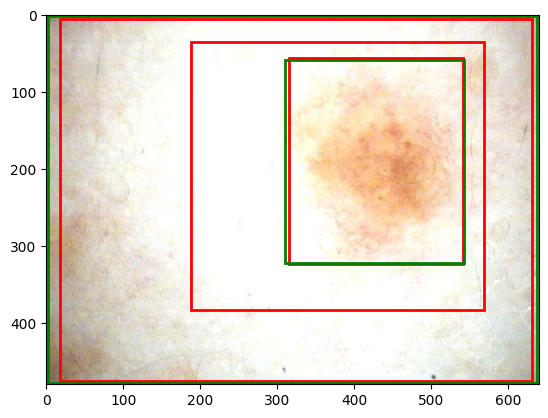

Image 0:
Predicted boxes: tensor([[2.6855e+03, 1.7560e+03, 3.0689e+03, 2.1955e+03],
        [1.8677e+01, 5.0508e+00, 5.9849e+03, 3.9211e+03]])
Ground truth boxes: tensor([[  19.,   10., 5978., 3982.],
        [2681., 1757., 3064., 2179.]])


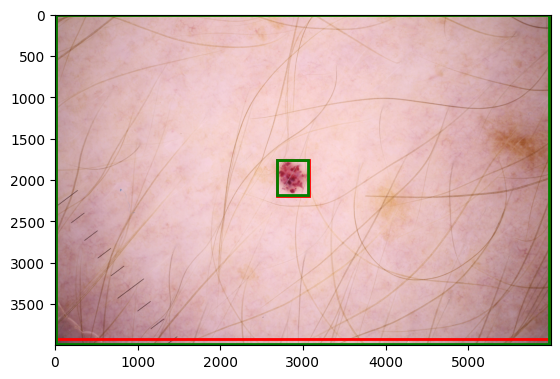

Image 1:
Predicted boxes: tensor([[  26.7243,    0.0000, 1869.5769, 1049.7733],
        [ 592.1129,  302.8147, 1038.7736,  726.6107],
        [1579.4846,   53.0533, 1797.7954,  107.2551]])
Ground truth boxes: tensor([[   5.,    3., 1864., 1047.],
        [ 582.,  316., 1049.,  724.],
        [1572.,   53., 1789.,  108.]])


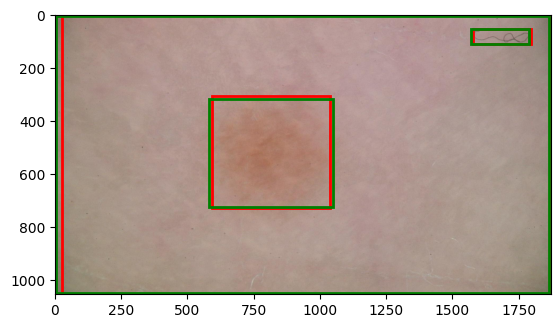

Image 0:
Predicted boxes: tensor([[412.5020, 333.3700, 630.7872, 477.2690],
        [190.5470,  79.5623, 417.1366, 401.7755],
        [  4.0039,   0.0000, 603.0570, 480.0000]])
Ground truth boxes: tensor([[  1.,   2., 637., 477.],
        [408., 332., 638., 475.],
        [191.,  87., 423., 403.]])


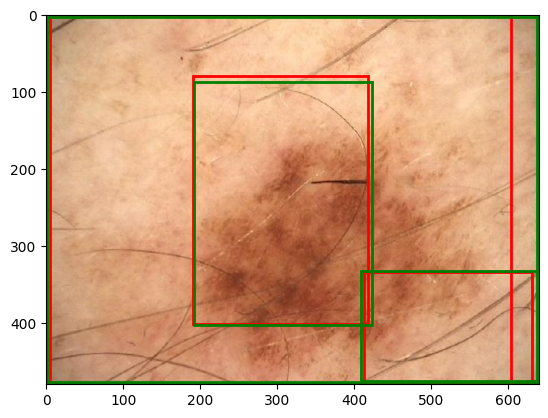

Image 1:
Predicted boxes: tensor([[2869.9917, 1853.5310, 3833.5435, 2968.2646],
        [  66.2070,    0.0000, 5932.0410, 3999.6685]])
Ground truth boxes: tensor([[  18.,   12., 5977., 3981.],
        [2865., 1853., 3805., 2948.]])


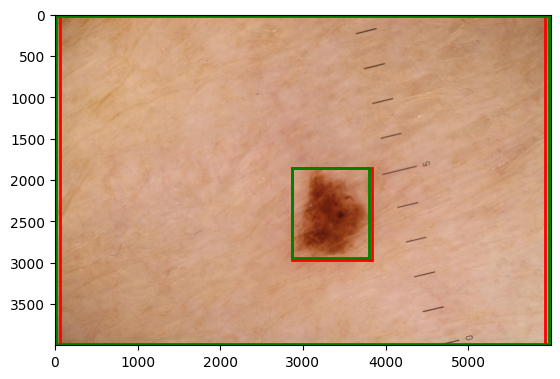

Image 0:
Predicted boxes: tensor([[206.4789,  22.3068, 457.6217, 253.5066],
        [365.2441, 288.6149, 427.1201, 417.9414],
        [  0.0000,   0.0000, 636.0345, 479.9421]])
Ground truth boxes: tensor([[204.,  27., 457., 250.],
        [  2.,   1., 637., 477.],
        [365., 290., 427., 413.]])


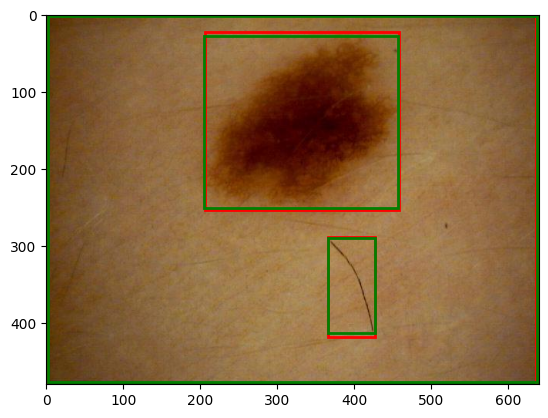

Image 1:
Predicted boxes: tensor([[ 704.0168,  181.1796, 1389.5790,  708.6489],
        [1051.2266,  201.3463, 1386.6019,  584.1130],
        [   9.0834,    0.0000, 1859.2108, 1050.4764],
        [ 731.8126,  341.4144, 1228.8223,  700.1620]])
Ground truth boxes: tensor([[   5.,    3., 1863., 1047.],
        [ 668.,  184., 1398.,  700.],
        [1040.,  193., 1396.,  591.]])


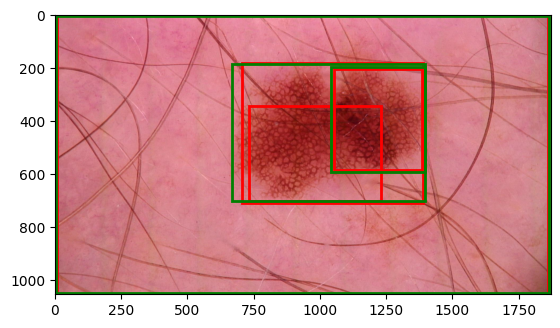

Image 0:
Predicted boxes: tensor([[428.5578,  39.9384, 495.6830,  98.2590],
        [ 28.9288, 130.4613,  73.6439, 170.8000],
        [133.0300, 116.5351, 474.9332, 411.0787],
        [  2.8239,   0.0000, 634.7007, 471.1598],
        [367.9006, 105.7368, 408.6368, 148.8931]])
Ground truth boxes: tensor([[  2.,   3., 636., 476.],
        [120., 112., 479., 415.],
        [429.,  40., 495.,  98.],
        [ 30., 131.,  74., 170.]])


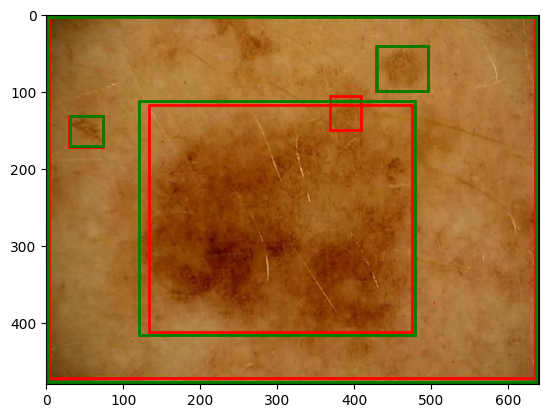

Image 1:
Predicted boxes: tensor([[2459.7073, 1591.1047, 4360.9780, 3928.7622],
        [2102.7871,  435.5558, 2599.3525,  884.1515],
        [2458.8984, 1708.4862, 4043.5908, 2898.8057],
        [2445.3513, 1722.1885, 3420.5234, 2330.8608],
        [   0.0000,   11.7946, 5930.8223, 4000.0000],
        [2140.3662,  629.7964, 2592.8625,  847.9827],
        [1562.0781, 1121.1884, 4698.6431, 3997.8918],
        [ 317.5024, 1934.4109, 5822.2764, 3812.2888]])
Ground truth boxes: tensor([[  18.,   17., 5970., 3970.],
        [2442., 1710., 3417., 2349.],
        [2100.,  422., 2595.,  875.],
        [2410., 1507., 4364., 3935.],
        [2436., 1700., 4041., 2920.]])


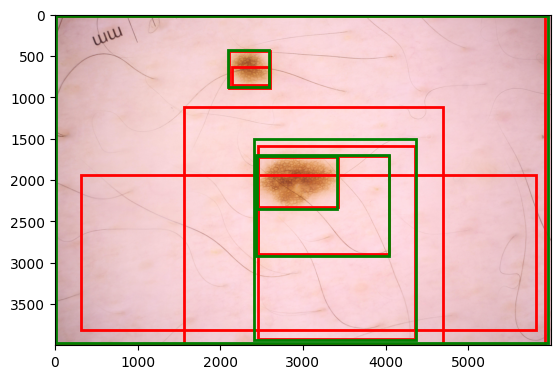

Mean IoU: 0.9013


In [ ]:
def evaluate_debug(model, data_loader, device):
    model.eval()
    all_ious = []

    with torch.no_grad():
        for images, targets in data_loader:
            images = list(img.to(device) for img in images)
            outputs = model(images)

            for idx, (output, target) in enumerate(zip(outputs, targets)):
                pred_boxes = output['boxes'].cpu()
                gt_boxes = target['boxes'].cpu()

                if len(gt_boxes) == 0 or len(pred_boxes) == 0:
                    continue  # Skip images without ground truth or predictions

                iou = box_iou(pred_boxes, gt_boxes).max(dim=1)[0].mean().item()
                all_ious.append(iou)

                # Debugging: Print and visualize
                print(f"Image {idx}:")
                print(f"Predicted boxes: {pred_boxes}")
                print(f"Ground truth boxes: {gt_boxes}")

                # Visualize predictions and ground truth
                img = images[idx].cpu().permute(1, 2, 0).numpy()
                plt.imshow(img)
                for box in pred_boxes:
                    plt.gca().add_patch(plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], fill=False, color='red', linewidth=2))
                for box in gt_boxes:
                    plt.gca().add_patch(plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], fill=False, color='green', linewidth=2))
                plt.show()

    mean_iou = sum(all_ious) / len(all_ious) if all_ious else 0.0
    print(f"Mean IoU: {mean_iou:.4f}")

# Evaluate the model with detailed debugging
evaluate_debug(model, eval_data_loader, device)
